In [1]:
#!pip install ultralytics -q

In [2]:
import os
import time
import shutil
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from ultralytics import YOLO
from tqdm.auto import tqdm

In [3]:
SEED = 42

PROJECT_ROOT = Path("..").resolve()

DATA_PROCESSED = PROJECT_ROOT / "data" / "processed"
OUTPUTS = PROJECT_ROOT / "outputs"
FIGURES = OUTPUTS / "figures"
TABLES = OUTPUTS / "tables"

RL_DIR = DATA_PROCESSED / "deblurred_gopro" / "richardson_lucy"

coco_pairs_path = DATA_PROCESSED / "coco_val_blur_pairs_metadata.csv"
coco_pairs_df = pd.read_csv(coco_pairs_path)

print(len(coco_pairs_df))
coco_pairs_df.head()

5000


,image_id,sharp_path,blur_path,sharp_shape,blur_shape,sharp_lap_var,blur_lap_var,blur_level,blur_ratio
0,139,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,"(426, 640)","(426, 640)",854.226167,854.226167,high_blur,1.0
1,285,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,"(640, 586)","(640, 586)",4351.070365,4351.070365,low_blur,1.0
2,632,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,"(483, 640)","(483, 640)",4177.362686,4177.362686,low_blur,1.0
3,724,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,"(500, 375)","(500, 375)",2844.920072,2844.920072,low_blur,1.0
4,776,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,"(640, 428)","(640, 428)",4690.731953,4690.731953,low_blur,1.0


In [4]:
device = 0
model = YOLO("yolov8n.pt")

In [5]:
COCO_RL_DIR = DATA_PROCESSED / "coco_rl_restored"
COCO_RL_DIR.mkdir(parents=True, exist_ok=True)

In [6]:
def read_rgb(path):
    img = cv2.imread(str(path))
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def save_rgb(path, image_rgb):
    image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)
    cv2.imwrite(str(path), image_bgr)

def resize_keep_aspect(image_rgb, max_dim=640):
    h, w = image_rgb.shape[:2]
    scale = min(max_dim / max(h, w), 1.0)
    new_w = int(w * scale)
    new_h = int(h * scale)
    if scale == 1.0:
        return image_rgb
    return cv2.resize(image_rgb, (new_w, new_h))

In [7]:
sample_n = min(200, len(coco_pairs_df))
eval_df = coco_pairs_df.sample(sample_n, random_state=SEED).reset_index(drop=True)

print(len(eval_df))

200


In [8]:
import math
from scipy.signal import convolve2d

def estimate_motion_angle(gray):
    edges = cv2.Canny((gray * 255).astype(np.uint8), 50, 150)
    lines = cv2.HoughLines(edges, 1, np.pi / 180, threshold=80)

    if lines is None:
        return 0.0

    angles = []

    for line in lines[:30]:
        rho, theta = line[0]
        angle = np.degrees(theta) - 90
        angles.append(angle)

    if len(angles) == 0:
        return 0.0

    return float(np.median(angles))

def estimate_kernel_length(blur_lap_var):
    if blur_lap_var < 20:
        return 21
    elif blur_lap_var < 50:
        return 17
    elif blur_lap_var < 100:
        return 13
    else:
        return 9

def motion_psf(length=15, angle=0):
    size = max(3, int(length))

    if size % 2 == 0:
        size += 1

    kernel = np.zeros((size, size), dtype=np.float32)
    center = size // 2

    x1 = center - (length // 2) * math.cos(math.radians(angle))
    y1 = center - (length // 2) * math.sin(math.radians(angle))
    x2 = center + (length // 2) * math.cos(math.radians(angle))
    y2 = center + (length // 2) * math.sin(math.radians(angle))

    cv2.line(
        kernel,
        (int(round(x1)), int(round(y1))),
        (int(round(x2)), int(round(y2))),
        1,
        thickness=1
    )

    kernel_sum = kernel.sum()

    if kernel_sum > 0:
        kernel /= kernel_sum

    return kernel

def richardson_lucy_channel(channel, kernel, iterations=6):
    estimate = np.full_like(channel, 0.5, dtype=np.float32)
    kernel_mirror = np.flipud(np.fliplr(kernel))
    eps = 1e-7

    for _ in range(iterations):
        conv_est = convolve2d(estimate, kernel, mode="same", boundary="symm")
        relative_blur = channel / (conv_est + eps)
        estimate *= convolve2d(relative_blur, kernel_mirror, mode="same", boundary="symm")
        estimate = np.clip(estimate, 0, 1)

    return estimate

def to_float32(img):
    return img.astype(np.float32) / 255.0

def to_uint8(img):
    img = np.clip(img * 255.0, 0, 255)
    return img.astype(np.uint8)

def rgb_to_ycrcb_float(image_rgb):
    img = to_float32(image_rgb)
    return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)

def ycrcb_float_to_rgb(ycrcb):
    rgb = cv2.cvtColor(np.clip(ycrcb, 0, 1), cv2.COLOR_YCrCb2RGB)
    return to_uint8(rgb)

def richardson_lucy_luma_rgb(image_rgb, kernel, iterations=6):
    ycrcb = rgb_to_ycrcb_float(image_rgb)
    y = ycrcb[:, :, 0]

    y_restored = richardson_lucy_channel(y, kernel, iterations=iterations)
    ycrcb[:, :, 0] = np.clip(y_restored, 0, 1)

    return ycrcb_float_to_rgb(ycrcb)

In [9]:
results = []

for _, row in tqdm(eval_df.iterrows(), total=len(eval_df)):
    image_id = str(row["image_id"])

    blur_img = read_rgb(row["blur_path"])
    sharp_img = read_rgb(row["sharp_path"])

    blur_img = resize_keep_aspect(blur_img, max_dim=640)
    sharp_img = resize_keep_aspect(sharp_img, max_dim=640)

    blur_gray = cv2.cvtColor(blur_img, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0

    est_angle = estimate_motion_angle(blur_gray)
    est_length = estimate_kernel_length(row["blur_lap_var"])
    kernel = motion_psf(length=est_length, angle=est_angle)

    rl_img = richardson_lucy_luma_rgb(blur_img, kernel, iterations=6)

    rl_path = COCO_RL_DIR / f"{image_id}.jpg"
    save_rgb(rl_path, rl_img)

    t0 = time.perf_counter()
    blur_pred = model.predict(source=blur_img, device=0, verbose=False)
    blur_time = time.perf_counter() - t0

    t0 = time.perf_counter()
    rl_pred = model.predict(source=rl_img, device=0, verbose=False)
    rl_time = time.perf_counter() - t0

    t0 = time.perf_counter()
    sharp_pred = model.predict(source=sharp_img, device=0, verbose=False)
    sharp_time = time.perf_counter() - t0

    blur_boxes = blur_pred[0].boxes
    rl_boxes = rl_pred[0].boxes
    sharp_boxes = sharp_pred[0].boxes

    blur_count = 0 if blur_boxes is None else len(blur_boxes)
    rl_count = 0 if rl_boxes is None else len(rl_boxes)
    sharp_count = 0 if sharp_boxes is None else len(sharp_boxes)

    blur_conf = 0.0 if blur_count == 0 else float(blur_boxes.conf.detach().cpu().mean().item())
    rl_conf = 0.0 if rl_count == 0 else float(rl_boxes.conf.detach().cpu().mean().item())
    sharp_conf = 0.0 if sharp_count == 0 else float(sharp_boxes.conf.detach().cpu().mean().item())

    results.append({
        "image_id": image_id,
        "blur_path": row["blur_path"],
        "sharp_path": row["sharp_path"],
        "rl_path": str(rl_path),
        "blur_level": row["blur_level"],

        "estimated_angle": float(est_angle),
        "estimated_kernel_length": int(est_length),

        "blur_detection_count": blur_count,
        "rl_detection_count": rl_count,
        "sharp_detection_count": sharp_count,

        "blur_avg_conf": blur_conf,
        "rl_avg_conf": rl_conf,
        "sharp_avg_conf": sharp_conf,

        "blur_runtime_sec": float(blur_time),
        "rl_runtime_sec": float(rl_time),
        "sharp_runtime_sec": float(sharp_time),
    })

results_df = pd.DataFrame(results)
results_df.head()

  0%|          | 0/200 [00:00<?, ?it/s]

,image_id,blur_path,sharp_path,rl_path,blur_level,estimated_angle,estimated_kernel_length,blur_detection_count,rl_detection_count,sharp_detection_count,blur_avg_conf,rl_avg_conf,sharp_avg_conf,blur_runtime_sec,rl_runtime_sec,sharp_runtime_sec
0,173183,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,-45.000000,9,0,0,0,0.000000,0.000000,0.000000,4.281162,0.059951,0.056938
1,297681,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,medium_blur,-1.000000,9,2,3,2,0.555293,0.337593,0.555293,0.764373,0.103681,0.080355
2,306733,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,medium_blur,-11.500004,9,3,3,3,0.567862,0.441121,0.567862,0.135183,0.140014,0.155642
3,125806,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,-45.000000,9,3,2,3,0.510345,0.785989,0.510345,0.262976,0.078816,0.088897
4,82807,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,high_blur,-45.000000,9,3,2,3,0.536936,0.564983,0.536936,0.414857,0.073100,0.097845


In [10]:
summary_table = pd.DataFrame({
    "domain": ["blurred", "richardson_lucy", "sharp"],
    "mean_detection_count": [
        results_df["blur_detection_count"].mean(),
        results_df["rl_detection_count"].mean(),
        results_df["sharp_detection_count"].mean()
    ],
    "mean_confidence": [
        results_df["blur_avg_conf"].mean(),
        results_df["rl_avg_conf"].mean(),
        results_df["sharp_avg_conf"].mean()
    ],
    "mean_runtime_sec": [
        results_df["blur_runtime_sec"].mean(),
        results_df["rl_runtime_sec"].mean(),
        results_df["sharp_runtime_sec"].mean()
    ]
})

summary_table

,domain,mean_detection_count,mean_confidence,mean_runtime_sec
0,blurred,4.065,0.601495,0.175747
1,richardson_lucy,2.795,0.557602,0.105036
2,sharp,4.065,0.601495,0.111013


In [11]:
summary_path = TABLES / "coco_pretrained_detection_summary.csv"
results_df.to_csv(TABLES / "coco_pretrained_detection_results.csv", index=False)
summary_table.to_csv(summary_path, index=False)

print(summary_path)

C:\Users\User\comp6001_assignment1\outputs\tables\coco_pretrained_detection_summary.csv


In [12]:
results_df["rl_detection_gain"] = results_df["rl_detection_count"] - results_df["blur_detection_count"]
results_df["rl_conf_gain"] = results_df["rl_avg_conf"] - results_df["blur_avg_conf"]

results_df["sharp_detection_gap"] = results_df["sharp_detection_count"] - results_df["rl_detection_count"]
results_df["sharp_conf_gap"] = results_df["sharp_avg_conf"] - results_df["rl_avg_conf"]

results_df.head()

,image_id,blur_path,sharp_path,rl_path,blur_level,estimated_angle,estimated_kernel_length,blur_detection_count,rl_detection_count,sharp_detection_count,blur_avg_conf,rl_avg_conf,sharp_avg_conf,blur_runtime_sec,rl_runtime_sec,sharp_runtime_sec,rl_detection_gain,rl_conf_gain,sharp_detection_gap,sharp_conf_gap
0,173183,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,-45.000000,9,0,0,0,0.000000,0.000000,0.000000,4.281162,0.059951,0.056938,0,0.000000,0,0.000000
1,297681,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,medium_blur,-1.000000,9,2,3,2,0.555293,0.337593,0.555293,0.764373,0.103681,0.080355,1,-0.217700,-1,0.217700
2,306733,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,medium_blur,-11.500004,9,3,3,3,0.567862,0.441121,0.567862,0.135183,0.140014,0.155642,0,-0.126741,0,0.126741
3,125806,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,-45.000000,9,3,2,3,0.510345,0.785989,0.510345,0.262976,0.078816,0.088897,-1,0.275644,1,-0.275644
4,82807,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,high_blur,-45.000000,9,3,2,3,0.536936,0.564983,0.536936,0.414857,0.073100,0.097845,-1,0.028047,1,-0.028047


In [13]:
results_df["rl_detection_gain"] = results_df["rl_detection_count"] - results_df["blur_detection_count"]
results_df["rl_conf_gain"] = results_df["rl_avg_conf"] - results_df["blur_avg_conf"]

results_df["sharp_detection_gap"] = results_df["sharp_detection_count"] - results_df["rl_detection_count"]
results_df["sharp_conf_gap"] = results_df["sharp_avg_conf"] - results_df["rl_avg_conf"]

results_df.head()

,image_id,blur_path,sharp_path,rl_path,blur_level,estimated_angle,estimated_kernel_length,blur_detection_count,rl_detection_count,sharp_detection_count,blur_avg_conf,rl_avg_conf,sharp_avg_conf,blur_runtime_sec,rl_runtime_sec,sharp_runtime_sec,rl_detection_gain,rl_conf_gain,sharp_detection_gap,sharp_conf_gap
0,173183,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,-45.000000,9,0,0,0,0.000000,0.000000,0.000000,4.281162,0.059951,0.056938,0,0.000000,0,0.000000
1,297681,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,medium_blur,-1.000000,9,2,3,2,0.555293,0.337593,0.555293,0.764373,0.103681,0.080355,1,-0.217700,-1,0.217700
2,306733,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,medium_blur,-11.500004,9,3,3,3,0.567862,0.441121,0.567862,0.135183,0.140014,0.155642,0,-0.126741,0,0.126741
3,125806,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,-45.000000,9,3,2,3,0.510345,0.785989,0.510345,0.262976,0.078816,0.088897,-1,0.275644,1,-0.275644
4,82807,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,high_blur,-45.000000,9,3,2,3,0.536936,0.564983,0.536936,0.414857,0.073100,0.097845,-1,0.028047,1,-0.028047


In [14]:
gain_summary = pd.DataFrame({
    "metric": [
        "avg_rl_detection_gain_over_blur",
        "avg_rl_confidence_gain_over_blur",
        "avg_sharp_detection_gap_over_rl",
        "avg_sharp_confidence_gap_over_rl"
    ],
    "value": [
        results_df["rl_detection_gain"].mean(),
        results_df["rl_conf_gain"].mean(),
        results_df["sharp_detection_gap"].mean(),
        results_df["sharp_conf_gap"].mean()
    ]
})

gain_summary

,metric,value
0,avg_rl_detection_gain_over_blur,-1.270000
1,avg_rl_confidence_gain_over_blur,-0.043893
2,avg_sharp_detection_gap_over_rl,1.270000
3,avg_sharp_confidence_gap_over_rl,0.043893


In [15]:
gain_summary.to_csv(TABLES / "coco_pretrained_detection_gain_summary.csv", index=False)

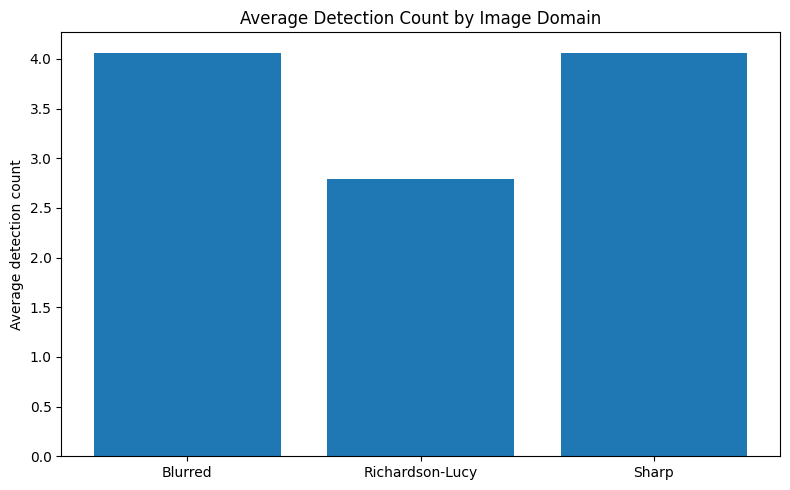

In [16]:
plt.figure(figsize=(8, 5))
x = ["Blurred", "Richardson-Lucy", "Sharp"]
y = [
    results_df["blur_detection_count"].mean(),
    results_df["rl_detection_count"].mean(),
    results_df["sharp_detection_count"].mean()
]
plt.bar(x, y)
plt.ylabel("Average detection count")
plt.title("Average Detection Count by Image Domain")
plt.tight_layout()
plt.savefig(FIGURES / "avg_detection_count_by_domain.png", dpi=200, bbox_inches="tight")
plt.show()

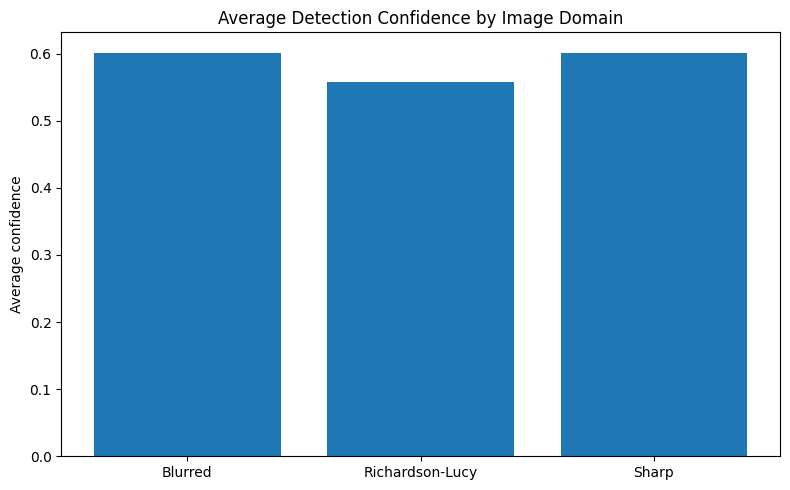

In [17]:
plt.figure(figsize=(8, 5))
x = ["Blurred", "Richardson-Lucy", "Sharp"]
y = [
    results_df["blur_avg_conf"].mean(),
    results_df["rl_avg_conf"].mean(),
    results_df["sharp_avg_conf"].mean()
]
plt.bar(x, y)
plt.ylabel("Average confidence")
plt.title("Average Detection Confidence by Image Domain")
plt.tight_layout()
plt.savefig(FIGURES / "avg_confidence_by_domain.png", dpi=200, bbox_inches="tight")
plt.show()

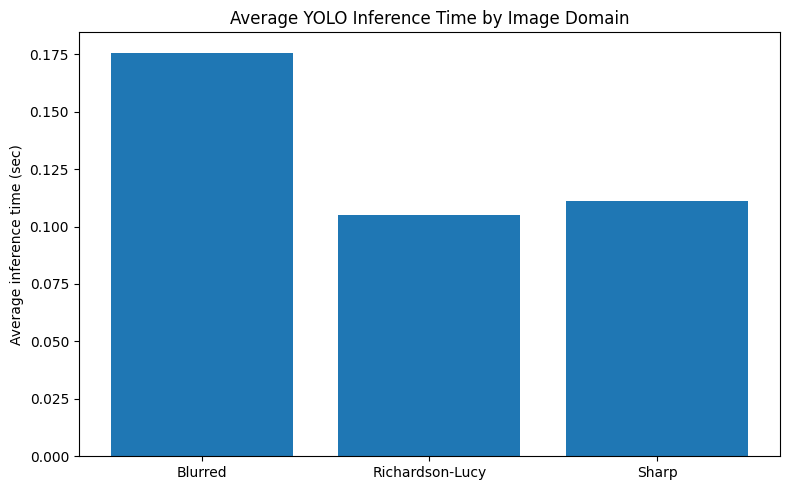

In [18]:
plt.figure(figsize=(8, 5))
x = ["Blurred", "Richardson-Lucy", "Sharp"]
y = [
    results_df["blur_runtime_sec"].mean(),
    results_df["rl_runtime_sec"].mean(),
    results_df["sharp_runtime_sec"].mean()
]
plt.bar(x, y)
plt.ylabel("Average inference time (sec)")
plt.title("Average YOLO Inference Time by Image Domain")
plt.tight_layout()
plt.savefig(FIGURES / "avg_inference_time_by_domain.png", dpi=200, bbox_inches="tight")
plt.show()

In [19]:
top_gain_df = results_df.sort_values("rl_conf_gain", ascending=False).head(5)
top_gain_df

,image_id,blur_path,sharp_path,rl_path,blur_level,estimated_angle,estimated_kernel_length,blur_detection_count,rl_detection_count,sharp_detection_count,blur_avg_conf,rl_avg_conf,sharp_avg_conf,blur_runtime_sec,rl_runtime_sec,sharp_runtime_sec,rl_detection_gain,rl_conf_gain,sharp_detection_gap,sharp_conf_gap
122,561335,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,-45.0,9,0,1,0,0.000000,0.680623,0.000000,0.129507,0.130308,0.107584,1,0.680623,-1,-0.680623
88,559513,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,high_blur,-0.5,9,2,1,2,0.372734,0.841600,0.372734,0.124770,0.116572,0.100511,-1,0.468866,1,-0.468866
100,179392,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,high_blur,-45.0,9,0,2,0,0.000000,0.391635,0.000000,0.143999,0.164036,0.216577,2,0.391635,-2,-0.391635
193,543043,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,-45.0,9,2,1,2,0.636783,0.950885,0.636783,0.109945,0.101675,0.075228,-1,0.314101,1,-0.314101
3,125806,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,-45.0,9,3,2,3,0.510345,0.785989,0.510345,0.262976,0.078816,0.088897,-1,0.275644,1,-0.275644


In [20]:
worst_gain_df = results_df.sort_values("rl_conf_gain", ascending=True).head(5)
worst_gain_df

,image_id,blur_path,sharp_path,rl_path,blur_level,estimated_angle,estimated_kernel_length,blur_detection_count,rl_detection_count,sharp_detection_count,blur_avg_conf,rl_avg_conf,sharp_avg_conf,blur_runtime_sec,rl_runtime_sec,sharp_runtime_sec,rl_detection_gain,rl_conf_gain,sharp_detection_gap,sharp_conf_gap
73,32038,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,high_blur,45.000000,9,1,0,1,0.785186,0.000000,0.785186,0.119653,0.087041,0.129531,-1,-0.785186,1,0.785186
27,35963,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,-45.000000,9,2,0,2,0.621875,0.000000,0.621875,0.220174,0.058347,0.058558,-2,-0.621875,2,0.621875
8,280325,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,-45.000000,9,2,0,2,0.597238,0.000000,0.597238,0.115533,0.074566,0.108795,-2,-0.597238,2,0.597238
20,109827,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,low_blur,2.999992,9,1,1,1,0.869903,0.323081,0.869903,0.113761,0.095755,0.092252,0,-0.546822,0,0.546822
116,244019,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\raw\co...,C:\Users\User\comp6001_assignment1\data\proces...,medium_blur,0.000000,9,1,1,1,0.921315,0.446798,0.921315,0.073599,0.076278,0.055678,0,-0.474517,0,0.474517


In [21]:
def get_prediction_outputs(image_rgb, model, device=0):
    pred = model.predict(image_rgb, device=device, verbose=False)
    result = pred[0]
    plotted = result.plot()
    plotted = cv2.cvtColor(plotted, cv2.COLOR_BGR2RGB)

    boxes = result.boxes
    classes = []
    confs = []

    if len(boxes) > 0:
        cls_ids = boxes.cls.cpu().numpy().astype(int)
        conf_vals = boxes.conf.cpu().numpy()

        for cls_id, conf in zip(cls_ids, conf_vals):
            classes.append(model.names[int(cls_id)])
            confs.append(float(conf))

    return plotted, classes, confs

In [22]:
def show_detection_triplet(row):
    blur_img = read_rgb(row["blur_path"])
    sharp_img = read_rgb(row["sharp_path"])
    rl_img = read_rgb(COCO_RL_DIR / f"{row['image_id']}.jpg")

    blur_img = resize_keep_aspect(blur_img, max_dim=640)
    sharp_img = resize_keep_aspect(sharp_img, max_dim=640)
    rl_img = resize_keep_aspect(rl_img, max_dim=640)

    blur_plot, blur_classes, blur_confs = get_prediction_outputs(blur_img, model, device=device)
    rl_plot, rl_classes, rl_confs = get_prediction_outputs(rl_img, model, device=device)
    sharp_plot, sharp_classes, sharp_confs = get_prediction_outputs(sharp_img, model, device=device)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(blur_plot)
    axes[0].set_title(
        f"Blurred\ncount={row['blur_detection_count']}, conf={row['blur_avg_conf']:.3f}"
    )
    axes[0].axis("off")

    axes[1].imshow(rl_plot)
    axes[1].set_title(
        f"Richardson-Lucy\ncount={row['rl_detection_count']}, conf={row['rl_avg_conf']:.3f}"
    )
    axes[1].axis("off")

    axes[2].imshow(sharp_plot)
    axes[2].set_title(
        f"Sharp\ncount={row['sharp_detection_count']}, conf={row['sharp_avg_conf']:.3f}"
    )
    axes[2].axis("off")

    plt.suptitle(f"Image ID: {row['image_id']}")
    plt.tight_layout()
    plt.show()

    print("Blurred classes:", blur_classes[:10])
    print("RL classes:", rl_classes[:10])
    print("Sharp classes:", sharp_classes[:10])

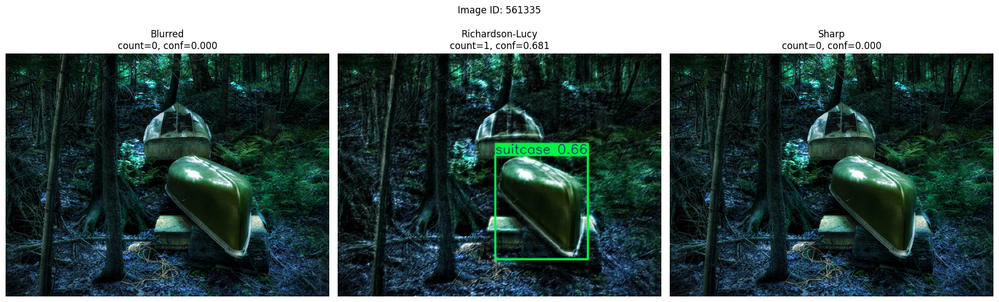

Blurred classes: []
RL classes: ['suitcase']
Sharp classes: []


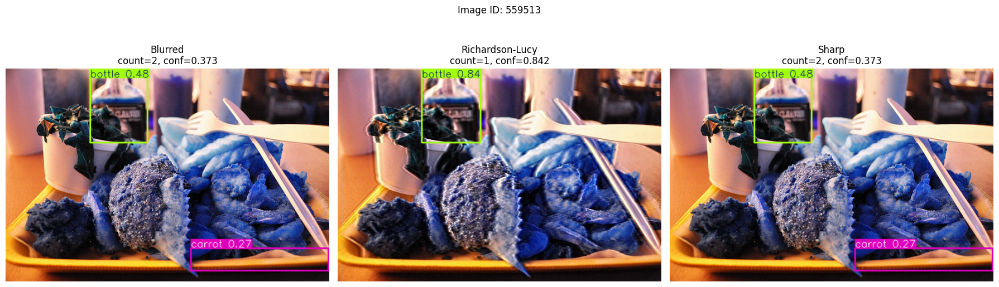

Blurred classes: ['bottle', 'carrot']
RL classes: ['bottle']
Sharp classes: ['bottle', 'carrot']


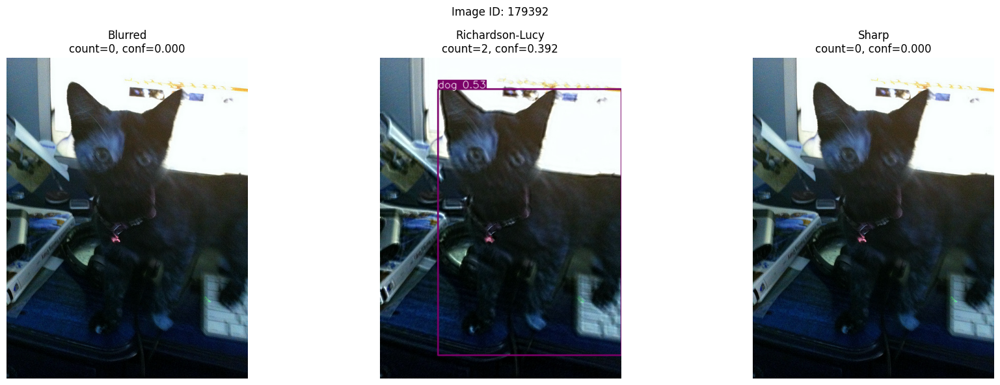

Blurred classes: []
RL classes: ['dog']
Sharp classes: []


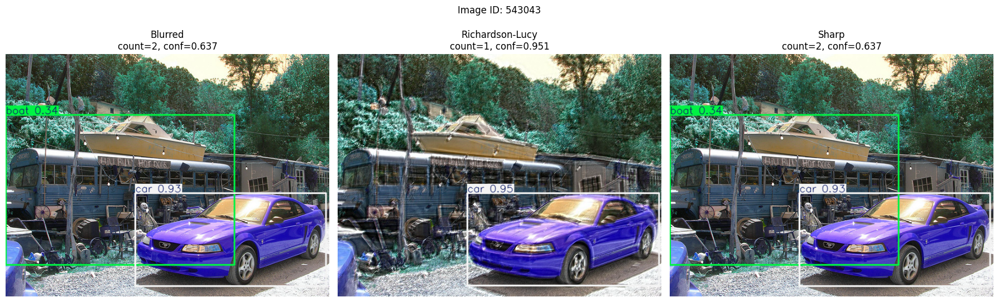

Blurred classes: ['car', 'boat']
RL classes: ['car']
Sharp classes: ['car', 'boat']


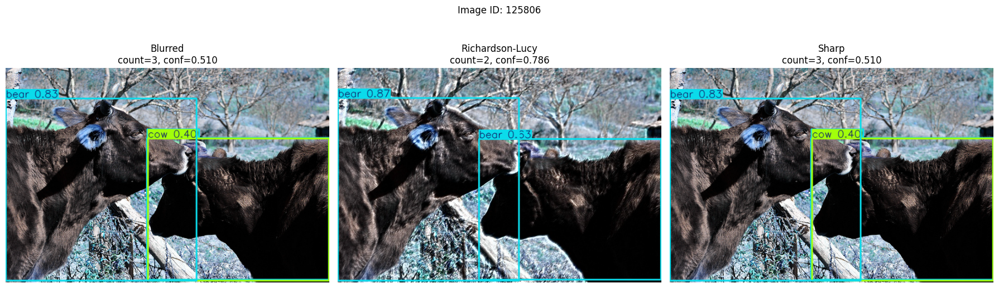

Blurred classes: ['bear', 'cow', 'bear']
RL classes: ['bear', 'bear']
Sharp classes: ['bear', 'cow', 'bear']


In [23]:
for _, row in top_gain_df.iterrows():
    show_detection_triplet(row)

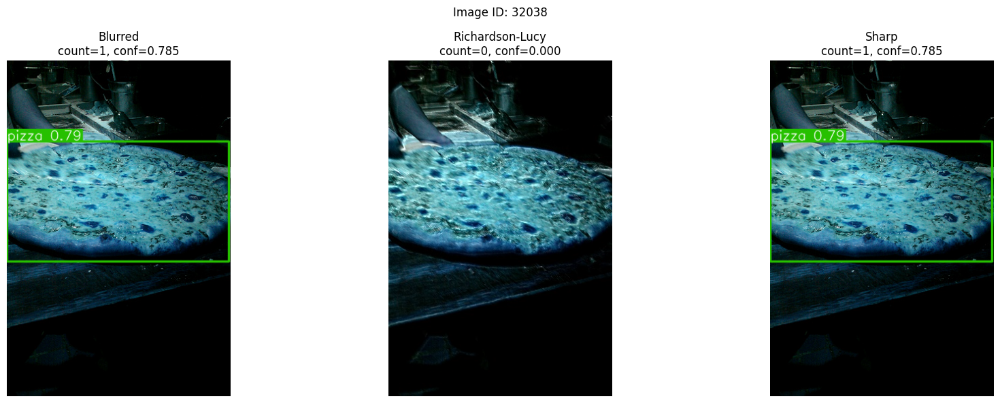

Blurred classes: ['pizza']
RL classes: []
Sharp classes: ['pizza']


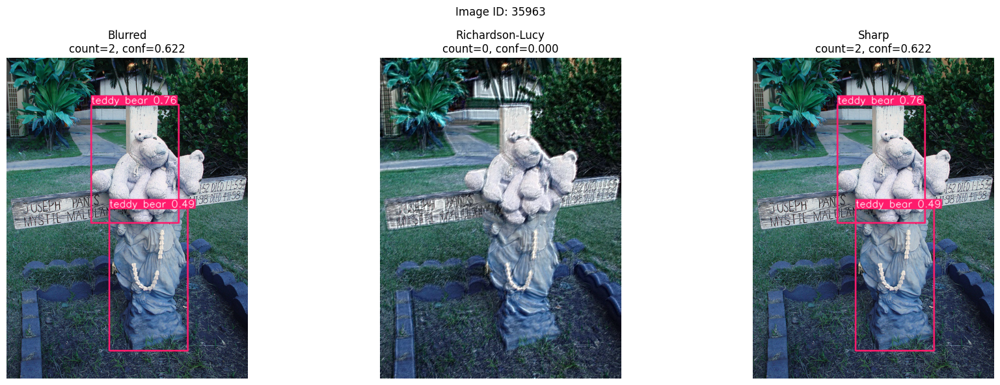

Blurred classes: ['teddy bear', 'teddy bear']
RL classes: []
Sharp classes: ['teddy bear', 'teddy bear']


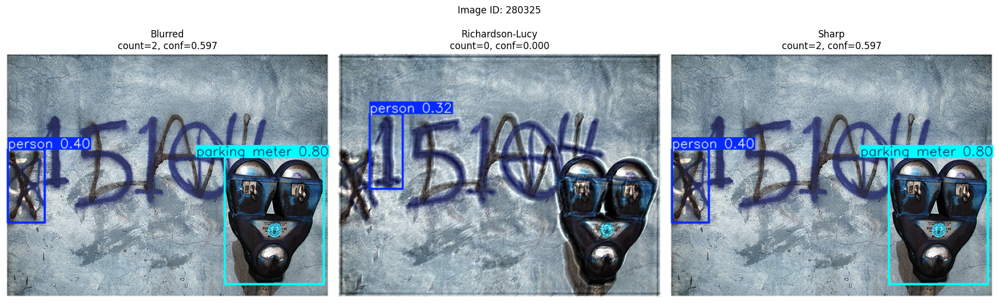

Blurred classes: ['parking meter', 'person']
RL classes: ['person']
Sharp classes: ['parking meter', 'person']


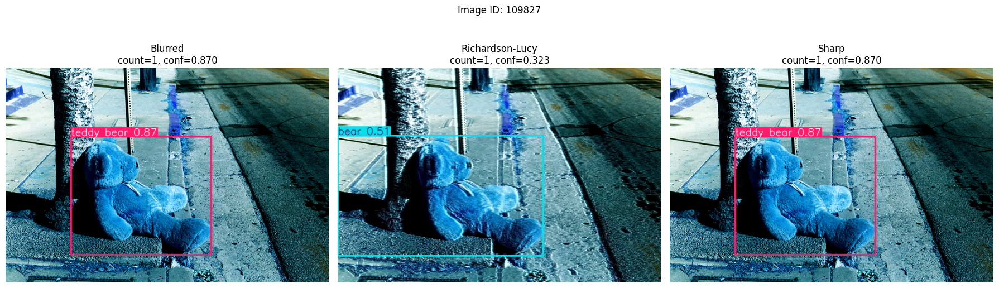

Blurred classes: ['teddy bear']
RL classes: ['bear']
Sharp classes: ['teddy bear']


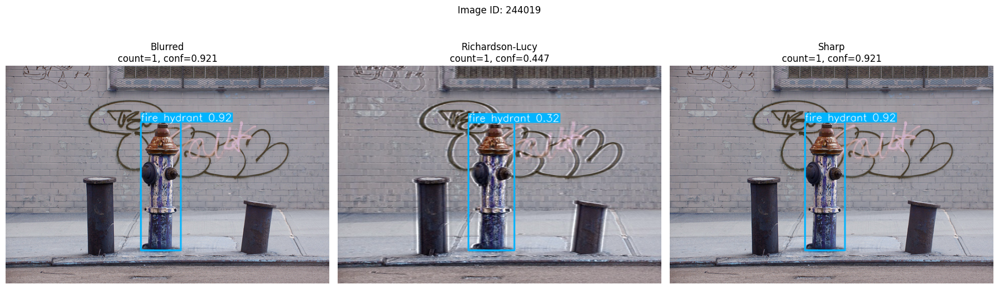

Blurred classes: ['fire hydrant']
RL classes: ['fire hydrant']
Sharp classes: ['fire hydrant']


In [24]:
for _, row in worst_gain_df.iterrows():
    show_detection_triplet(row)

In [34]:
def save_detection_triplet(row, save_dir):
    save_dir = Path(save_dir)
    save_dir.mkdir(parents=True, exist_ok=True)

    blur_img = read_rgb(row["blur_path"])
    sharp_img = read_rgb(row["sharp_path"])
    rl_img = read_rgb(row["rl_path"])

    blur_plot, blur_classes, blur_confs = get_prediction_outputs(blur_img, model, device=0)
    rl_plot, rl_classes, rl_confs = get_prediction_outputs(rl_img, model, device=0)
    sharp_plot, sharp_classes, sharp_confs = get_prediction_outputs(sharp_img, model, device=0)

    blur_count = len(blur_classes)
    rl_count = len(rl_classes)
    sharp_count = len(sharp_classes)

    blur_conf = float(np.mean(blur_confs)) if len(blur_confs) > 0 else 0.0
    rl_conf = float(np.mean(rl_confs)) if len(rl_confs) > 0 else 0.0
    sharp_conf = float(np.mean(sharp_confs)) if len(sharp_confs) > 0 else 0.0

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(blur_plot)
    axes[0].set_title(f"Blurred\nCount={blur_count}, Conf={blur_conf:.3f}")
    axes[0].axis("off")

    axes[1].imshow(rl_plot)
    axes[1].set_title(f"Richardson-Lucy\nCount={rl_count}, Conf={rl_conf:.3f}")
    axes[1].axis("off")

    axes[2].imshow(sharp_plot)
    axes[2].set_title(f"Sharp\nCount={sharp_count}, Conf={sharp_conf:.3f}")
    axes[2].axis("off")

    image_name = Path(row["blur_path"]).stem

    plt.suptitle(f"Detection Comparison: {image_name}")
    plt.tight_layout()

    out_path = save_dir / f"{image_name}_triplet.png"
    plt.savefig(out_path, dpi=200, bbox_inches="tight")
    plt.close()

    return out_path

In [35]:
DETECTION_EXAMPLES_DIR = FIGURES / "detection_examples"
DETECTION_EXAMPLES_DIR.mkdir(parents=True, exist_ok=True)
for _, row in top_gain_df.iterrows():
 save_detection_triplet(row, DETECTION_EXAMPLES_DIR)

In [36]:
for _, row in worst_gain_df.iterrows():
 save_detection_triplet(row, DETECTION_EXAMPLES_DIR)

In [40]:
interpretation = {
"avg_blur_count": float(results_df["blur_detection_count"].mean()),
"avg_rl_count": float(results_df["rl_detection_count"].mean()),
"avg_sharp_count": float(results_df["sharp_detection_count"].mean()),
"avg_blur_conf": float(results_df["blur_avg_conf"].mean()),
"avg_rl_conf": float(results_df["rl_avg_conf"].mean()),
"avg_sharp_conf": float(results_df["sharp_avg_conf"].mean()),

}
interpretation

{'avg_blur_count': 4.065,
 'avg_rl_count': 2.795,
 'avg_sharp_count': 4.065,
 'avg_blur_conf': 0.6014947809278965,
 'avg_rl_conf': 0.5576018850505352,
 'avg_sharp_conf': 0.6014947809278965}

In [41]:
domain_compare = results_df[[
    "image_id",
    "blur_detection_count",
    "rl_detection_count",
    "sharp_detection_count",
    "blur_avg_conf",
    "rl_avg_conf",
    "sharp_avg_conf",
    "rl_detection_gain",
    "rl_conf_gain"
]].copy()

domain_compare.head()

,image_id,blur_detection_count,rl_detection_count,sharp_detection_count,blur_avg_conf,rl_avg_conf,sharp_avg_conf,rl_detection_gain,rl_conf_gain
0,173183,0,0,0,0.000000,0.000000,0.000000,0,0.000000
1,297681,2,3,2,0.555293,0.337593,0.555293,1,-0.217700
2,306733,3,3,3,0.567862,0.441121,0.567862,0,-0.126741
3,125806,3,2,3,0.510345,0.785989,0.510345,-1,0.275644
4,82807,3,2,3,0.536936,0.564983,0.536936,-1,0.028047


In [42]:
domain_compare.to_csv(TABLES / "coco_domain_comparison_table.csv", index=False)

In [43]:
improved_count = (results_df["rl_detection_count"] > results_df["blur_detection_count"]).sum()
same_count = (results_df["rl_detection_count"] == results_df["blur_detection_count"]).sum()
worse_count = (results_df["rl_detection_count"] < results_df["blur_detection_count"]).sum()

improved_conf = (results_df["rl_avg_conf"] > results_df["blur_avg_conf"]).sum()
same_conf = (results_df["rl_avg_conf"] == results_df["blur_avg_conf"]).sum()
worse_conf = (results_df["rl_avg_conf"] < results_df["blur_avg_conf"]).sum()

comparison_summary = pd.DataFrame({
    "case": [
        "RL higher detection count than blur",
        "RL same detection count as blur",
        "RL lower detection count than blur",
        "RL higher confidence than blur",
        "RL same confidence as blur",
        "RL lower confidence than blur"
    ],
    "count": [
        improved_count,
        same_count,
        worse_count,
        improved_conf,
        same_conf,
        worse_conf
    ]
})

comparison_summary

,case,count
0,RL higher detection count than blur,25
1,RL same detection count as blur,68
2,RL lower detection count than blur,107
3,RL higher confidence than blur,72
4,RL same confidence as blur,5
5,RL lower confidence than blur,123


In [44]:
comparison_summary.to_csv(TABLES / "coco_detection_case_summary.csv", index=False)

In [45]:
detection_log = {
    "num_images": int(len(results_df)),
    "avg_blur_detection_count": float(results_df["blur_detection_count"].mean()),
    "avg_rl_detection_count": float(results_df["rl_detection_count"].mean()),
    "avg_sharp_detection_count": float(results_df["sharp_detection_count"].mean()),
    "avg_blur_confidence": float(results_df["blur_avg_conf"].mean()),
    "avg_rl_confidence": float(results_df["rl_avg_conf"].mean()),
    "avg_sharp_confidence": float(results_df["sharp_avg_conf"].mean()),
    "avg_rl_detection_gain_over_blur": float(results_df["rl_detection_gain"].mean()),
    "avg_rl_confidence_gain_over_blur": float(results_df["rl_conf_gain"].mean())
}

detection_log

{'num_images': 200,
 'avg_blur_detection_count': 4.065,
 'avg_rl_detection_count': 2.795,
 'avg_sharp_detection_count': 4.065,
 'avg_blur_confidence': 0.6014947809278965,
 'avg_rl_confidence': 0.5576018850505352,
 'avg_sharp_confidence': 0.6014947809278965,
 'avg_rl_detection_gain_over_blur': -1.27,
 'avg_rl_confidence_gain_over_blur': -0.043892895877361296}

In [46]:
summary_table

,domain,mean_detection_count,mean_confidence,mean_runtime_sec
0,blurred,4.065,0.601495,0.175747
1,richardson_lucy,2.795,0.557602,0.105036
2,sharp,4.065,0.601495,0.111013


In [47]:
gain_summary

,metric,value
0,avg_rl_detection_gain_over_blur,-1.270000
1,avg_rl_confidence_gain_over_blur,-0.043893
2,avg_sharp_detection_gap_over_rl,1.270000
3,avg_sharp_confidence_gap_over_rl,0.043893
